In [4]:
%matplotlib inline
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
import pylab
pylab.rcParams['figure.figsize'] = (8.0, 10.0)
import json

In [5]:
import pandas as pd
from IPython.core.display import HTML

In [6]:
dataDir='..'
dataType='val2017'

annFile='{}/annotations/instances_{}.json'.format(dataDir,dataType)

In [7]:
# dataDir='/datasets/COCO-2017'
# dataType='val2017'
# annFile='{}/annotations/instances_{}.json'.format(dataDir,dataType)
# #annFile='annotations/instances_{}.json'.format(dataType)

In [8]:
# initialize COCO api for instance annotations
coco=COCO(annFile)

loading annotations into memory...
Done (t=1.12s)
creating index...
index created!


In [9]:
# display COCO categories and supercategories
# cats = coco.loadCats(coco.getCatIds())
# nms=[cat['name'] for cat in cats]
# print('COCO categories: \n{}\n'.format(' '.join(nms)))

# nms = set([cat['supercategory'] for cat in cats])
# print('COCO supercategories: \n{}'.format(' '.join(nms)))

In [10]:
len(cats)

NameError: name 'cats' is not defined

In [ ]:
# # get all images containing given categories, select one at random
# catIds = coco.getCatIds(catNms=['person','dog','skateboard']);
# imgIds = coco.getImgIds(catIds=catIds );
# #imgIds = coco.getImgIds(imgIds = [324158])
# #img = coco.loadImgs(imgIds[np.random.randint(0,len(imgIds))])[0]

In [ ]:
# imgIds

In [ ]:
# catIds = coco.getCatIds(catNms=['car','dog']);
# imgIds = coco.getImgIds(catIds=catIds);
# print(len(imgIds))
# imgIds

Adding several more unrelated categories did not change the returned images which demonstrates that COCO identifies images with a majority of the given categories and mostly has images of natural settings.

In [ ]:
# catIds = coco.getCatIds(catNms=['dog', 'flower', 'cloud', 'car']);
# imgIds = coco.getImgIds(catIds=catIds);
# print(len(imgIds))
# imgIds

In [ ]:
annFile = '{}/annotations/captions_{}.json'.format(dataDir,dataType)
coco_caps=COCO(annFile)

In [ ]:

import json

with open('codebeautify.json') as f:
    data = json.load(f)

# Output: {'name': 'Bob', 'languages': ['English', 'Fench']}
print(data)



In [ ]:
import json
with open('codebeautify.json') as f:
    data = json.load(f)
base_objects=[]
add_objects=[]
for i in data['base_objects']:
    
    base_objects.append(i)
for i in data['add_objects']:
    
    add_objects.append(i)
    
add_objects


In [11]:
from PIL import Image
def get_associated_objects_images(base, added):
    impath = '/images/'
    #lst = []
    catIds = coco.getCatIds(catNms=base);
    imgIds = coco.getImgIds(catIds=catIds);
    
    catIds2 = coco.getCatIds(catNms=base+added);
    imgIds2 = coco.getImgIds(catIds=catIds2);
    perc = len(imgIds2)/len(imgIds) * 100
    
    summary =  "{}% of the images with {} have {}".format(perc,', '.join(base_objects),
                                                     ', '.join(add_objects))
    for i in imgIds2:
        img = coco.loadImgs(i)[0]
        I=io.imread(img['coco_url'])
        plt.axis('off')
        ax= plt.imshow(I)
        plt.imsave('../images/'+str(i)+'.png', I)
        plt.show(ax)
    return summary

In [12]:

def call_df(lst):
    df = pd.DataFrame()
    for i in lst:
        df['image'].append(io.imread(i))
    return df

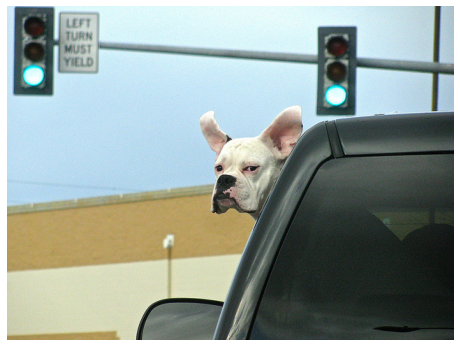

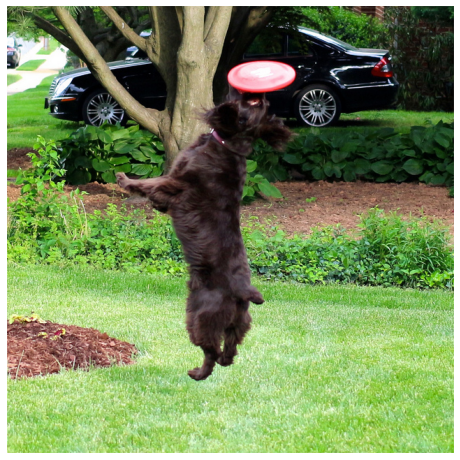

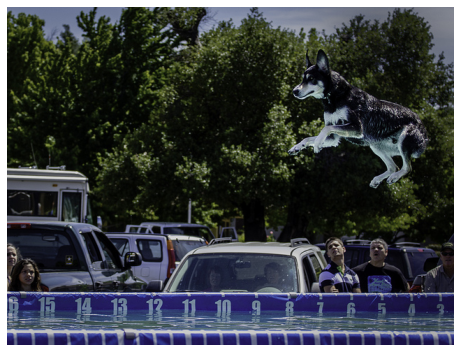

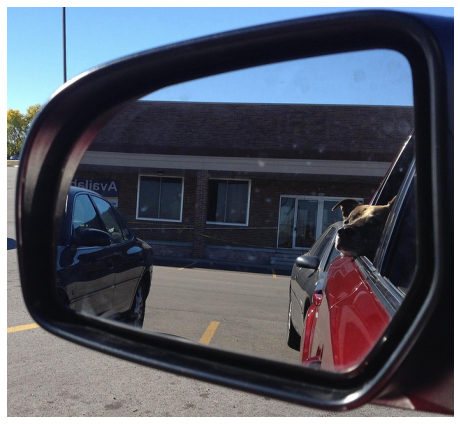

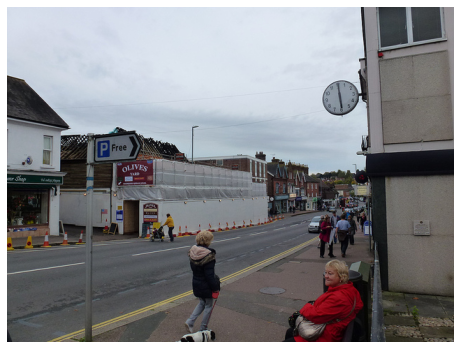

...

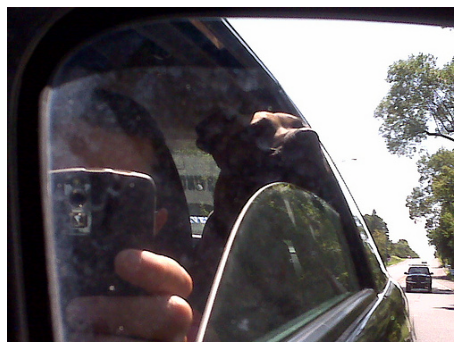

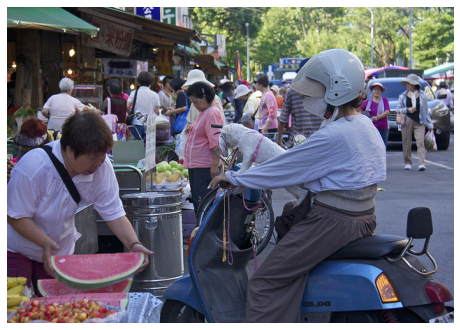

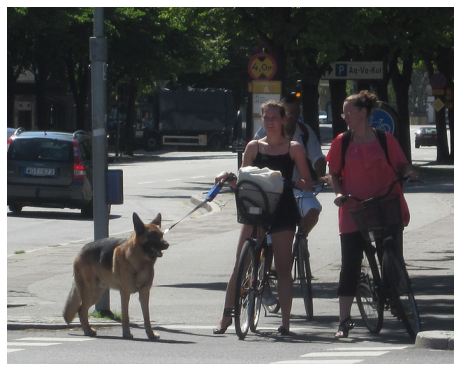

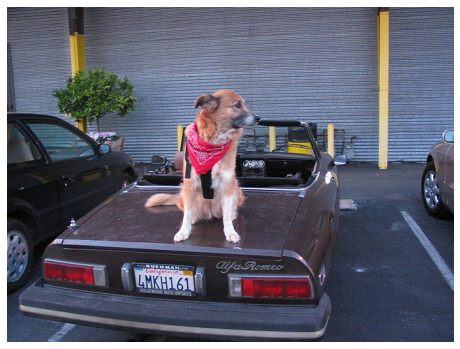

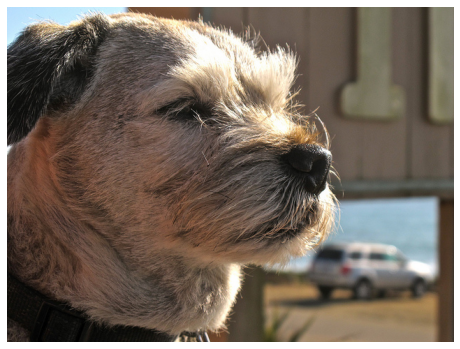

'3.551401869158879% of the images with car have dog, phone'

In [13]:
import json
with open('Config/data_params.json') as f:
    data = json.load(f)
base_objects=[]
add_objects=[]
for i in data['base_objects']:
    
    base_objects.append(i)
for i in data['add_objects']:
    
    add_objects.append(i)
    
get_associated_objects_images(base_objects, add_objects)


In [32]:

def get_associated_objects_images_with_ann(base, added):
    impath = '../images'
    #lst = []
    catIds = coco.getCatIds(catNms=base);
    imgIds = coco.getImgIds(catIds=catIds);
    
    catIds2 = coco.getCatIds(catNms=base+added);
    imgIds2 = coco.getImgIds(catIds=catIds2);
    
    
    perc = len(imgIds2)/len(imgIds) * 100
    #other_perc = len(imgIds4)/len(imgIds3)*100
    
    summary =  "{}% of the images with {} have {}".format(perc,', '.join(base_objects),
                                                          ', '.join(add_objects))

    for i in imgIds2:
        img = coco.loadImgs(i)[0]
        I=io.imread(img['coco_url'])
        plt.axis('off')
        ax= plt.imshow(I)


        annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds2, iscrowd=None)
        anns = coco.loadAnns(annIds)
        
        ax = coco.showAnns(anns, draw_bbox= True)
        plt.show(ax)

       

        annIds = coco_caps.getAnnIds(imgIds=img['id']);
        anns = coco_caps.loadAnns(annIds)
        caps = coco_caps.showAnns(anns)
        
        plt.show(caps)
        
    #print(call_df(lst))
    return summary

    

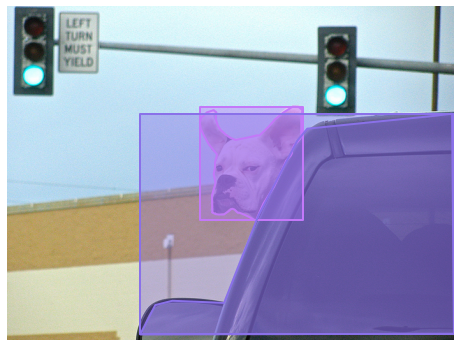

A dog is sticking it head outside of a car window 
a dog in a car on a street near a traffic light
A dogs head hanging out the window of a vehicle.
The dog holds it's head out of a car window near traffic signals.
A dog sticking it's head out of the drivers side window.


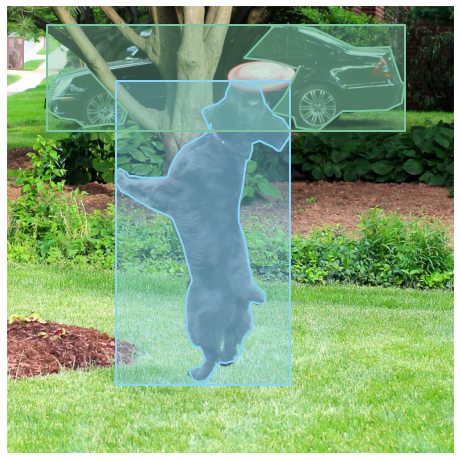

a dog jumping to catch a frisbee in a yard
A dog jumping to catch a red frisbee in a garden
The dog is catching the Frisbee in mid air in the yard.
A dog catches a frisbee outside in the grass.
A dog leaping to catch a red frisbee.


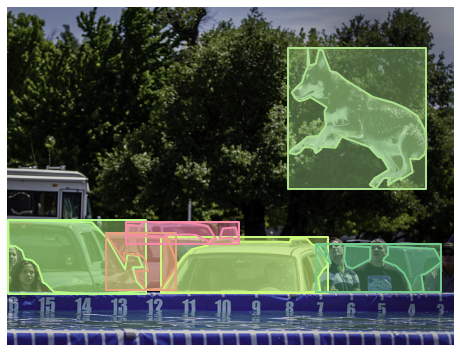

A lot of people that are looking at a pool.
A dog jumping through the air into a pool.
A dog jumping through the air above a pool of water that has been marked for distance, with people watching in the distance.
A husky jumping jumping above the water of a pool
A dog competing in a long jump in to water contest


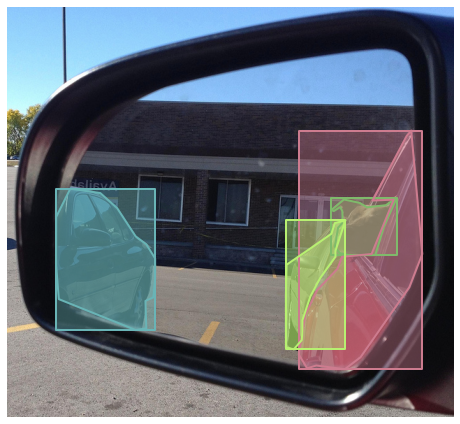

rear view mirror reflection showing a dog in the back seat
A dog sticks its head out of the car and is reflected in the side mirror. 
A couple of red cars parked in front of a house.
A side mirror shows a dog sticking its head out of a car window.
A mirror shot of a dog sitting in a car.


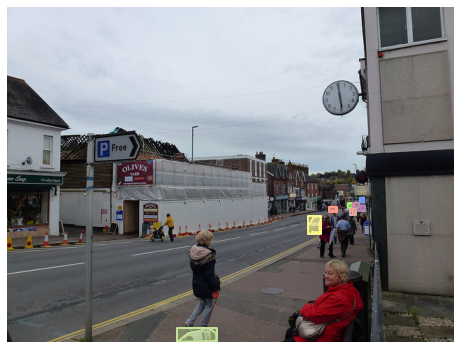

A street lined with cones with people up and down the sidewalk.
People are walking down the sidewalk in a city. 
A woman sits on a bench as people walk down a sidewalk. 
There are people walking down the street that is crowd
A woman waiting on a bench on the sidewalk as people go by. 


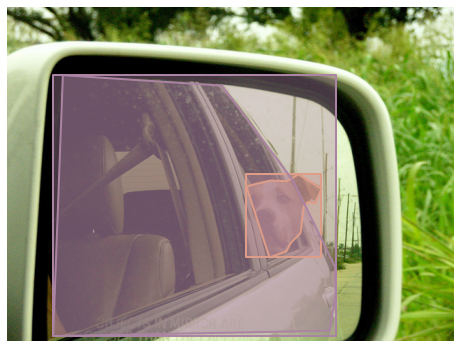

The reflection of a dogs head out of a car window in one of the cars wing mirrors
An adorable brown and white dog  hanging it's head out of a window.
a dog has its head hanging out of a window
A dog looking out the window as seen through a mirror.
A dog that is sitting down in a backseat.


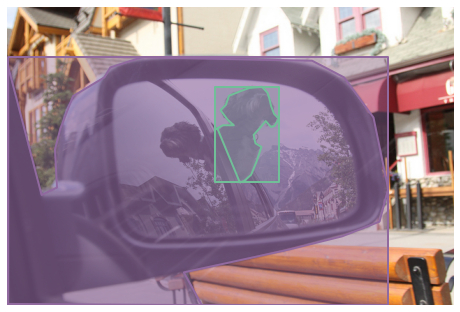

A dog hanging out of a back door window.
A dog is shown in a car rear view mirror.
A dog sticks his head out of a car window.
A dog looks out of the window as the car driver goes past a historic town.
a reflection of a dog looking out a window in a side view mirror 


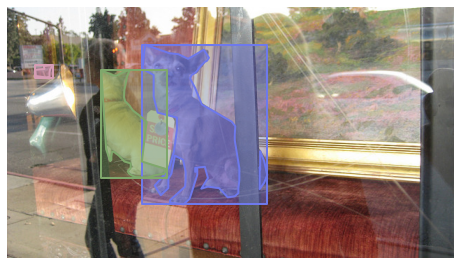

a dog sits on a chair behind a glass 
Small dog sitting on display behind the window. 
A chihuahua sits in a window display with a price tag.
A store's display window with two adorable Chihuahua dog statues.
a dog is siting behind a large window


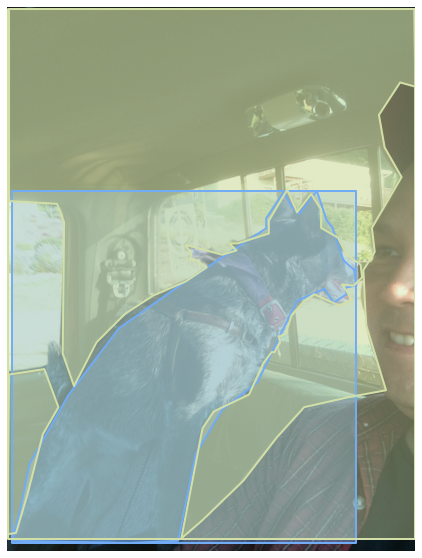

A small dog is looking out a car window.
A dog on a leash looks out the rear window while sitting next to a male passenger.
A small dog in a car standing on his owner.
A man and a dog riding in the cab of a pickup truck.
A dog looking out the back window of a car.


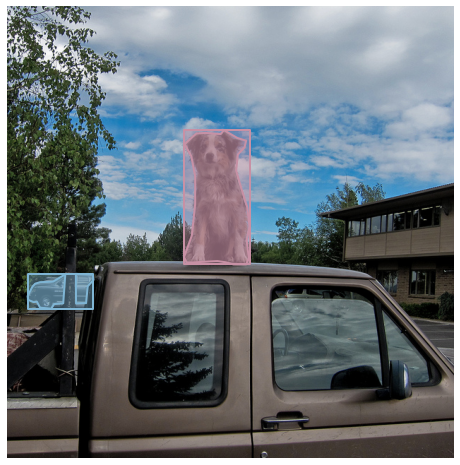

There is a dog on top of a truck outside.
A small dog sitting on top of a truck.
A dog sits on top of a truck.
a little dog sitting on the roof of a club cab truck
a dog that is standing on top of a truck


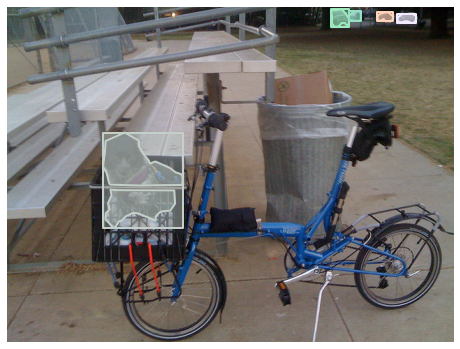

A dog sits in the basket of a bicycle leaning against bleachers.
A dog sitting in a basket mounted on the front of a blue bike.
A dog waits in the basket of the bicycle.
A blue bicycle with a puppy in its basket is parked next to the bleacher steps. 
A blue bicycle with a black basket on the front of it


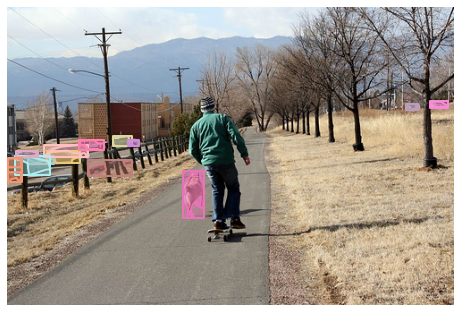

A man is skate boarding down a path and a dog is running by his side.
A man on a skateboard with a dog outside. 
A person riding a skate board with a dog following beside.
This man is riding a skateboard behind a dog.
A man walking his dog on a quiet country road.


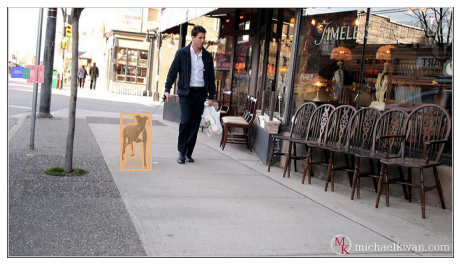

a man is walking his dog through the city
A man walks his dog down the sidewalk.
A man is walking a dog on a sidewalk.
A man walking his dog down a sidewalk.
A man walks a dog past rows of chairs outside a store.


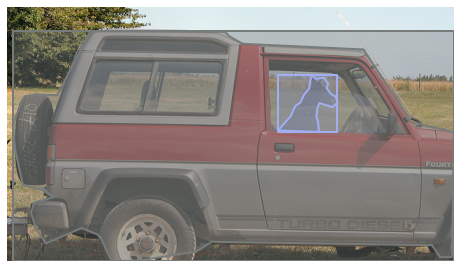

A dog driving an SUV in an open grass covered field.
A dog sits in the front seat of a jeep. 
A dog is sitting inside a red car.
A red truck has a black dog in the drivers chair.
A dog sitting in the front seat of a truck.


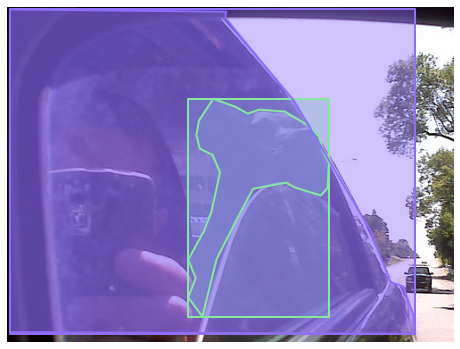

Guy takes a picture  of his dog in the backseat through his side mirror. 
A person holds a phone in a car with the window rolled down
A person taking a picture with a cell phone of them and a dog in a mirror.
The woman is holding her phone toward the dog hanging out the car window.
Car with window down and dog sticking out while taking pictures


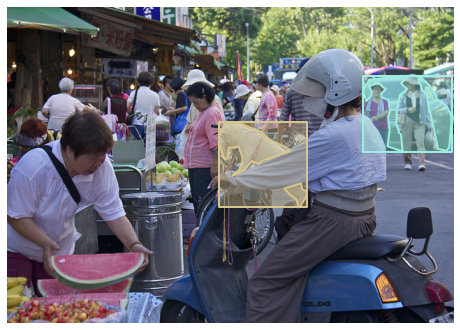

A street scene with a person on a motorcycle.
a person on a motorcycle along a farmers market
A woman is showing a watermelon slice to a woman on a scooter.
A person on a motorcycle talking to a person with a watermelon.
People at a veggie and fruit market looking at the merchandise.


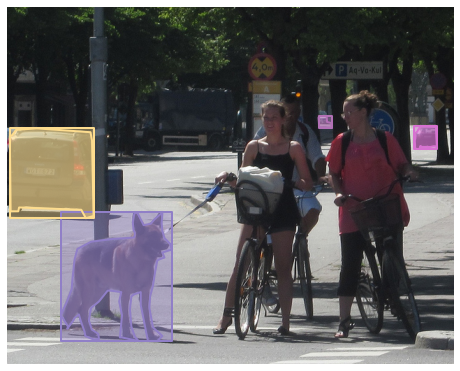

a couple of women that have a dog on a leash
A person who is on a bike with a dog on a leash. 
a dog is pulling a woman on a bike
A few people riding bikes next to a dog on a leash.
A dog being led down the street, by a woman on a bike.


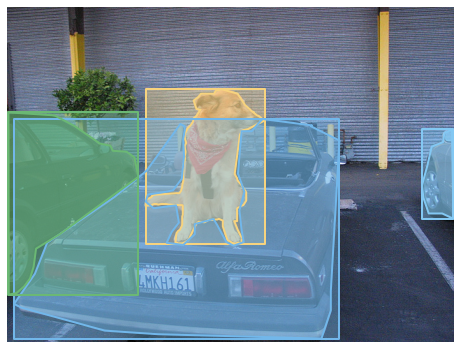

A dog standing on the back of a brown car.
a dog that is sitting on top of a brown car
a dog with a bandana on the trunk of a car
A dog with a bandana sitting on the trunk of a car.
A dog wearing a bandanna and sitting on the trunk of a car.


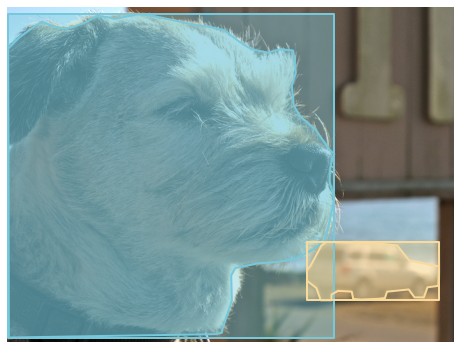

a vety cute furry dog posing near a big sign.
a close up of a dog with a car in the back
The small dog has a tiny black nose.
A grey dog with a black collar sits outside in the sun. 
A dog looking away from the camera in the wind.


'3.551401869158879% of the images with car have dog, phone'

In [26]:
get_associated_objects_images_with_ann(base_objects, add_objects)